# Comprehensive OpenCV Assignment

Follow the instructions in each section and write your code in the provided empty cells using the specified file names.

## 1. Reading Images and Videos
**Task:**
1. Read the image `cats.jpg` and display it.
2. Read the video `dog.mp4` and display it frame by frame. Ensure the video window closes when the 'd' key is pressed.

In [1]:
from matplotlib import pyplot as plt
import cv2
def imshow(title = "", image = None, size = 10):
 
    h,w = image.shape[0], image.shape[1]
    aspect_ratio = w/h
 
    plt.figure(figsize=(size * aspect_ratio, size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()


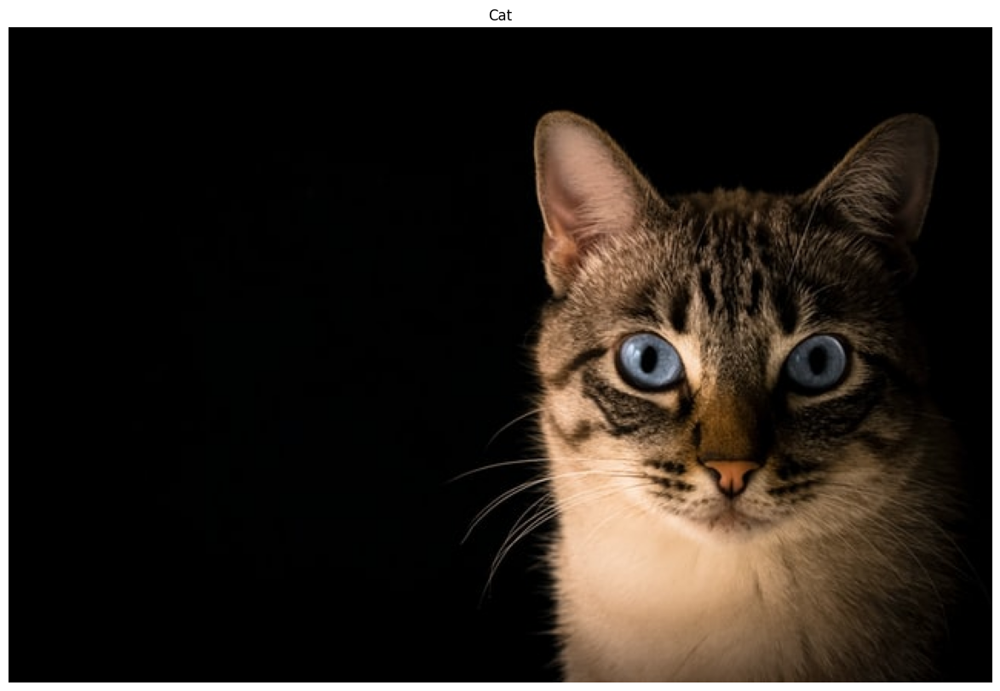

In [2]:
# Write your code here
cat = cv2.imread('cat.jpg')
imshow("Cat", cat)

## 2. Drawing and Text
**Task:**
1. Create a blank image of size $500 \times 500$ with 3 color channels.
2. Paint a portion of the image red ($[200:300, 300:400]$).
3. Draw a green rectangle from $(0,0)$ to the center of the image.
4. Draw a red circle at the center with a radius of 40.
5. Draw a white line from $(100, 250)$ to $(300, 400)$.



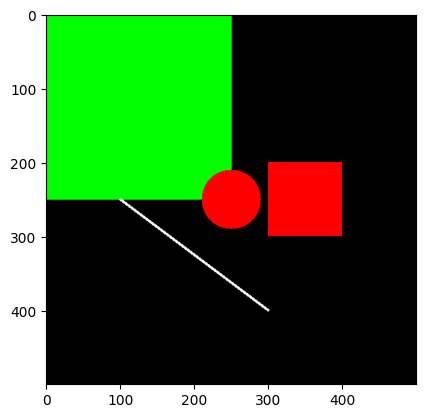

In [3]:
# Write your code here
import numpy as np

image = np.zeros((500,500,3), np.uint8)
image[200:300, 300:400] = [255,0,0] 
cv2.rectangle(image, (0,0), (250, 250), (0,255,0), -1)
cv2.circle(image, (250,250), 40, (255,0,0), -1)
cv2.line(image, (100,250), (300, 400), (255,255,255), 2)
plt.imshow(image)
plt.show()

## 3. Basic Image Functions
**Task:**
1. Load `park.jpg`.
2. Convert it to grayscale.
3. Apply Gaussian Blur with a $(7,7)$ kernel.
4. Perform Canny Edge detection on the blurred image.


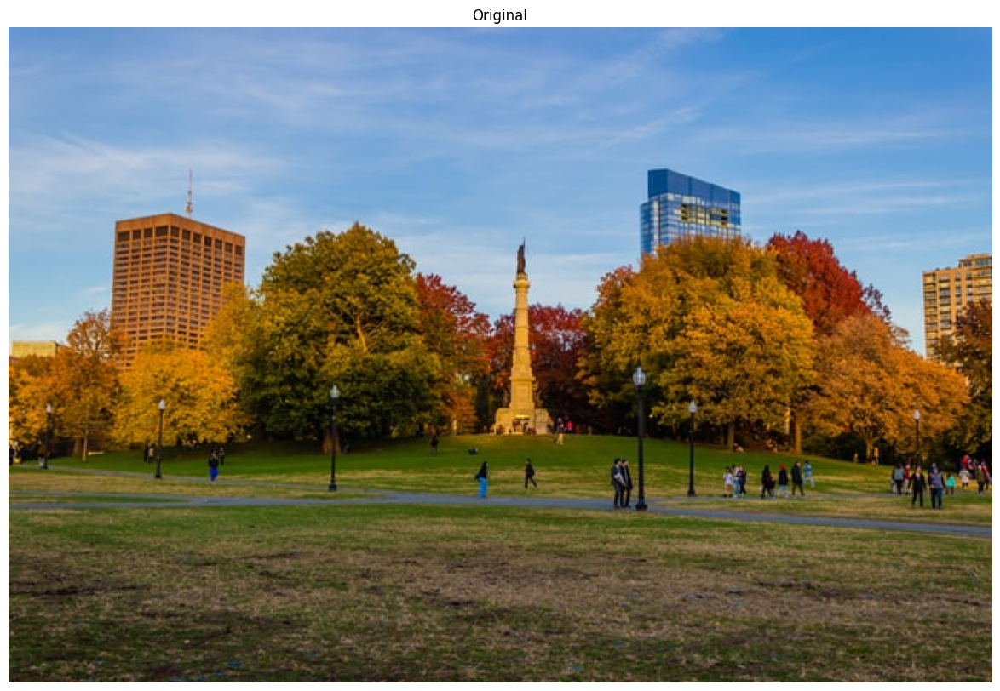

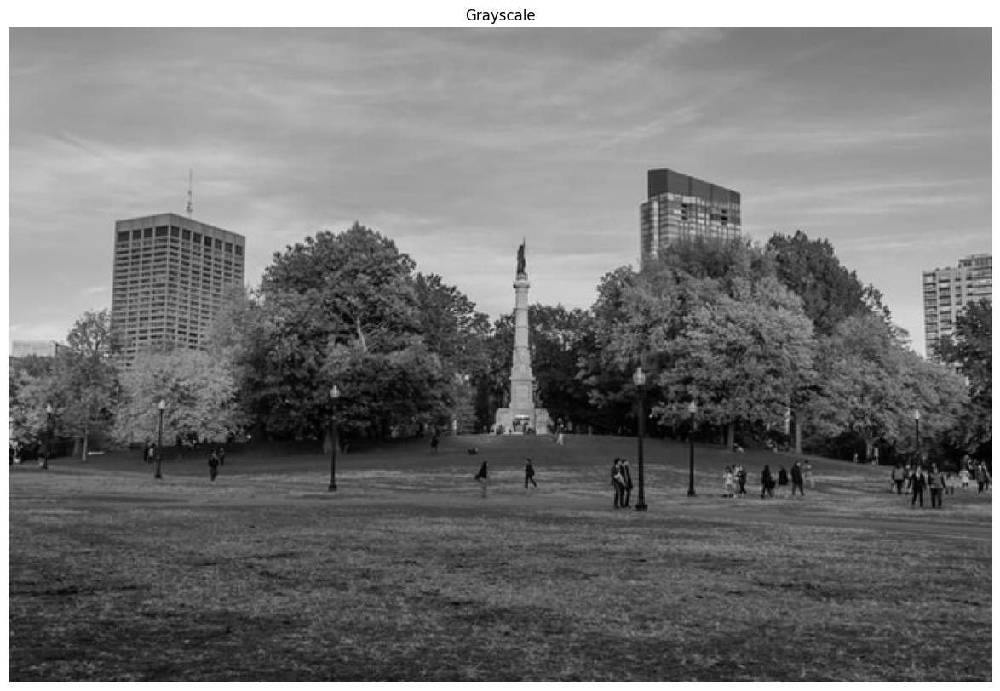

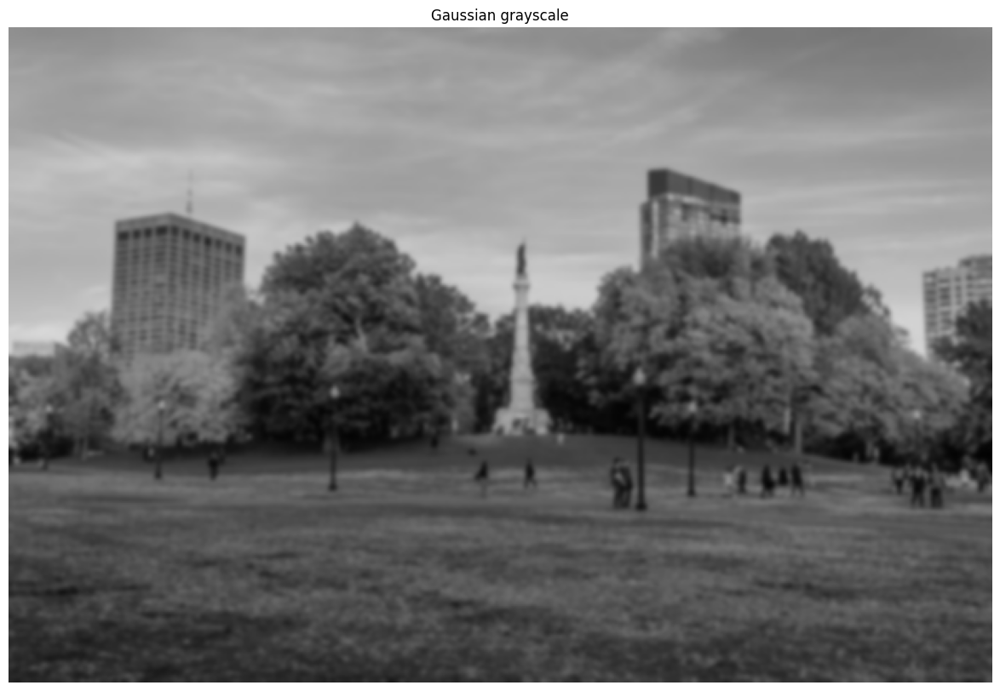

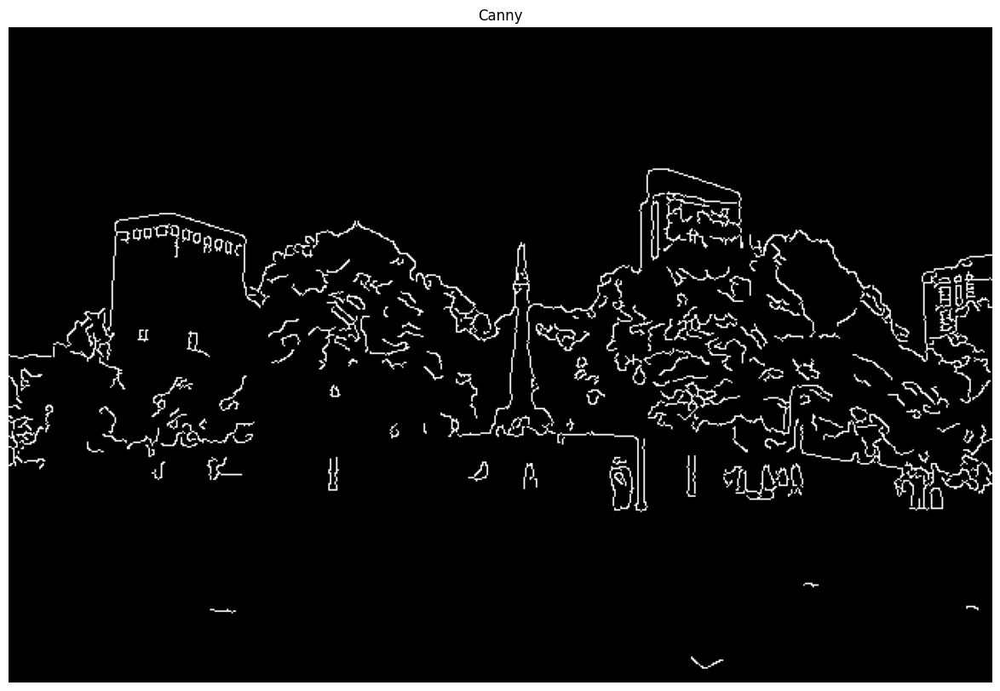

In [4]:
# Write your code here
park = cv2.imread('park.jpg')
gray_park = cv2.cvtColor(park, cv2.COLOR_BGR2GRAY)
Gaussian_park = cv2.GaussianBlur(gray_park, (7,7), 0)
def autoCanny(image):
  med_val = np.median(image) 
  lower = int(max(0, 0.66 * med_val))
  upper = int(min(255, 1.33 * med_val))
  edges = cv2.Canny(image=image, threshold1=lower, threshold2=upper)
  return edges
Canny_park = autoCanny(Gaussian_park)

imshow("Original", park)
imshow("Grayscale", gray_park)
imshow("Gaussian grayscale", Gaussian_park)
imshow("Canny", Canny_park)
# plt.imshow(gray_park, cmap='gray')
# plt.show()

## 4. Image Transformations
**Task:**
1. Create a function `translate(img, x, y)` to shift an image.
2. Create a function `rotate(img, angle, rotPoint=None)` to rotate an image.
3. Apply a flip transformation to `park.jpg`.

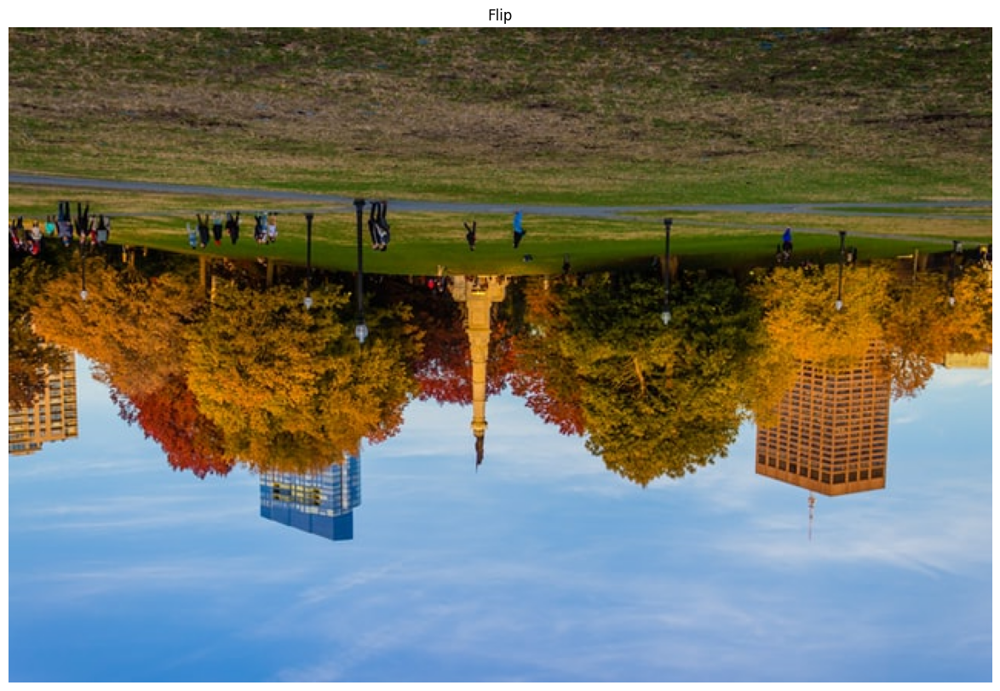

In [5]:
# Write your code here
def translate(image = None, x=0, y=0):
    h, w = image.shape[:2]
    T = np.float32([[1, 0, x], [0, 1,y]])
    img_translation = cv2.warpAffine(image, T, (w, h))
    return img_translation

def rotate(img, angle, rotPoint=None):
    height, width = image.shape[:2]
    rotation_matrix = cv2.getRotationMatrix2D(rotPoint, angle, 1)
    rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
    return rotated_image
flipped = cv2.flip(park, -1)
imshow("Flip", flipped)
    


## 5. Contour Detection
**Task:**
1. Load `cats.jpg`.
2. Convert to grayscale and apply Gaussian blur.
3. Find the edges using Canny.
4. Use `cv.findContours` to find all contours.
5. Print the count and draw them on a blank image.

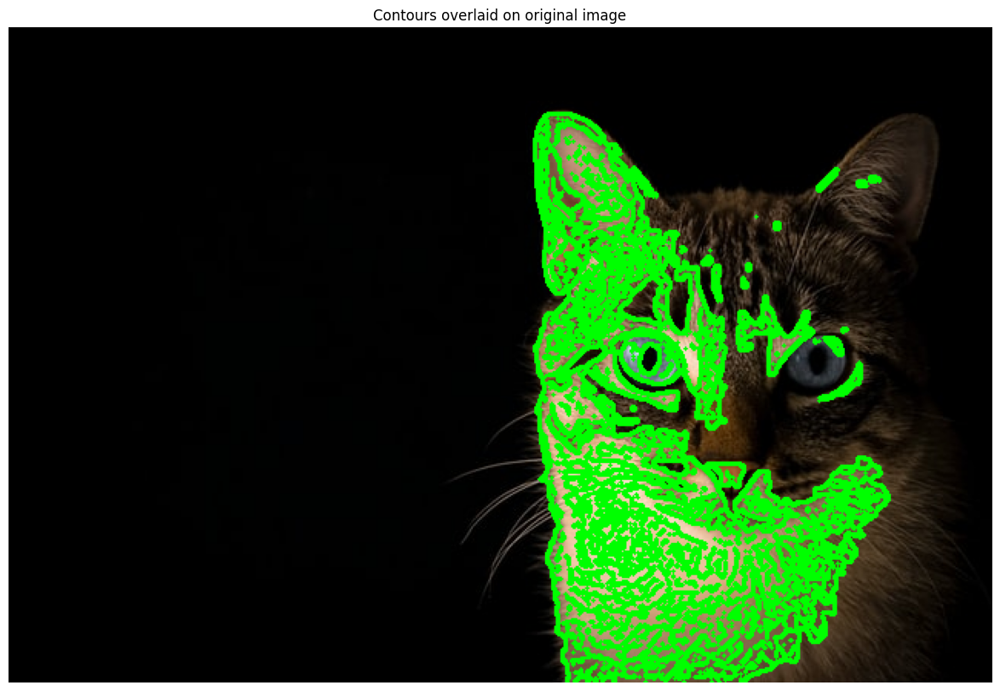

Number of Contours found = 966


In [6]:
# Write your code here
cat = cv2.imread('cat.jpg')
gray_cat = cv2.cvtColor(cat, cv2.COLOR_BGR2GRAY)
Gaussian_cat = cv2.GaussianBlur(gray_cat, (7,7), 0)
_, th2 = cv2.threshold(Gaussian_cat, 0, 255, cv2.THRESH_TOZERO + cv2.THRESH_OTSU)
canny_cat = autoCanny(th2)
contours, hierarchy = cv2.findContours(canny_cat, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
cv2.drawContours(cat, contours, -1, (0,255,0), thickness = 2)
imshow('Contours overlaid on original image', cat)

print("Number of Contours found = " + str(len(contours)))

## 6. Color Spaces
**Task:**
1. Load `park.jpg`.
2. Convert and display in: Gray, HSV,and RGB.

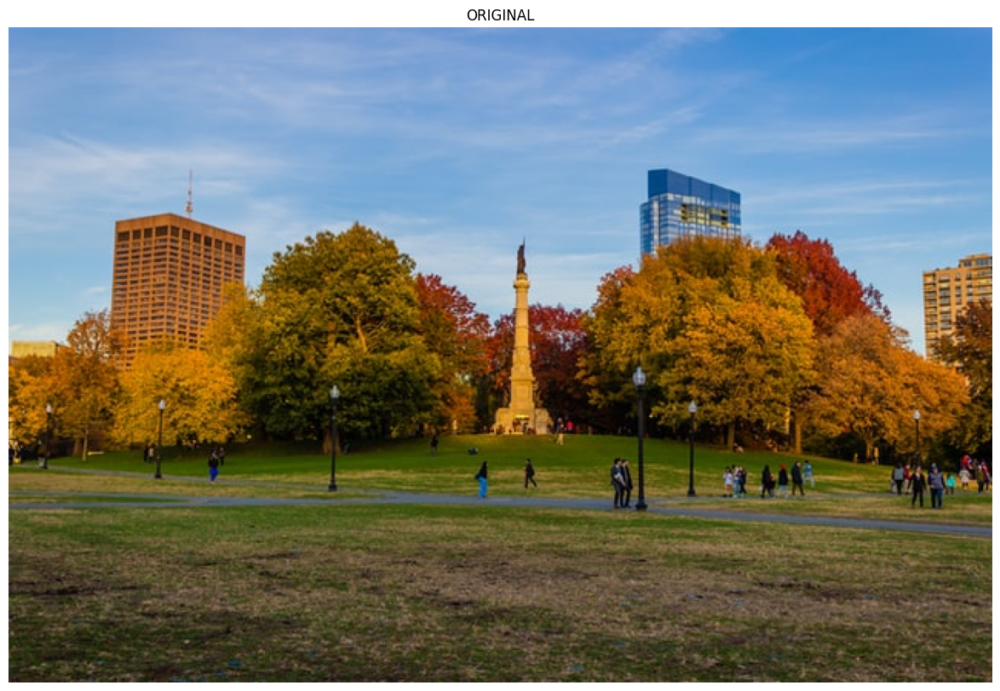

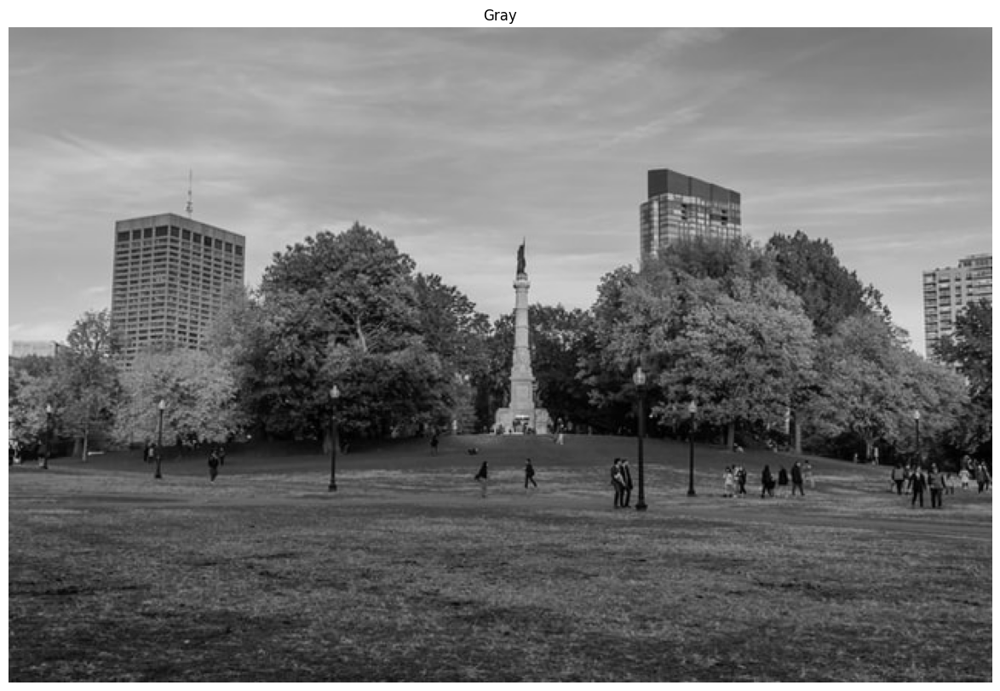

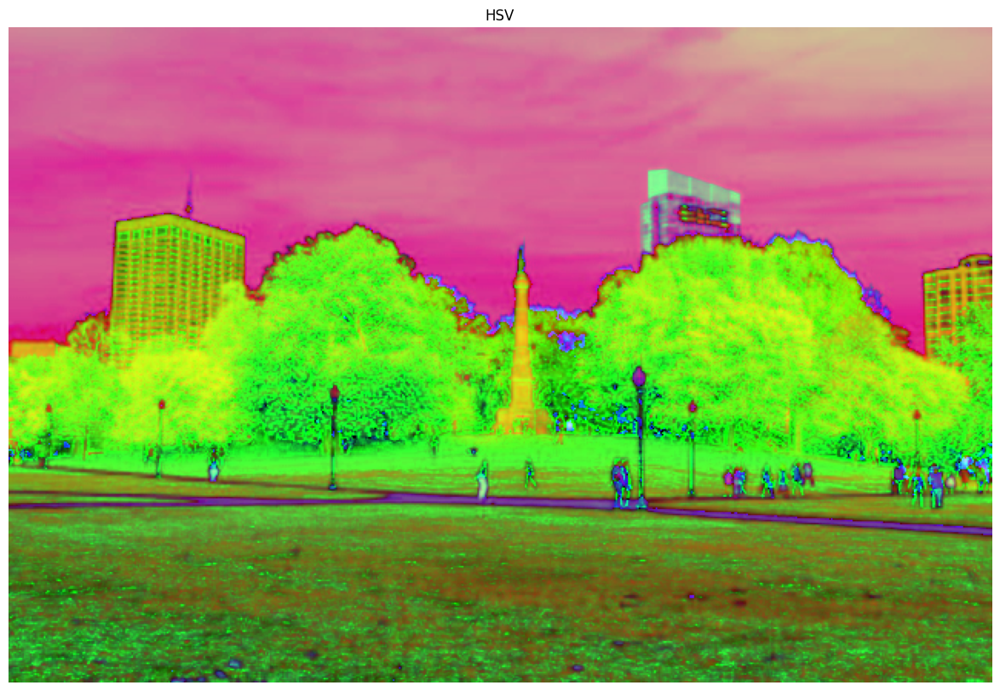

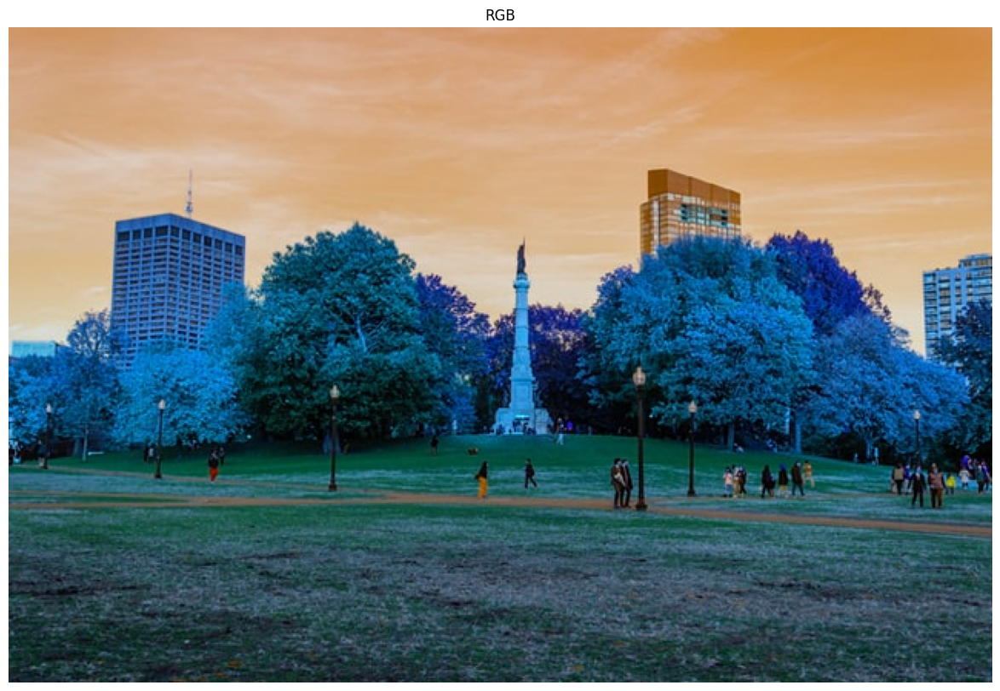

In [7]:
# Write your code here
park = cv2.imread('park.jpg')
gray_park = cv2.cvtColor(park, cv2. COLOR_BGR2GRAY)
hsv_park = cv2.cvtColor(park, cv2. COLOR_BGR2HSV_FULL)
rgb_park = cv2.cvtColor(park, cv2. COLOR_BGR2RGB)
imshow('ORIGINAL', park)
imshow('Gray', gray_park)
imshow('HSV', hsv_park)
imshow('RGB', rgb_park)


## 7. Smoothing and Blurring
**Task:**
1. Load `cats.jpg`.
2. Apply Averaging, Gaussian and Median Blurs

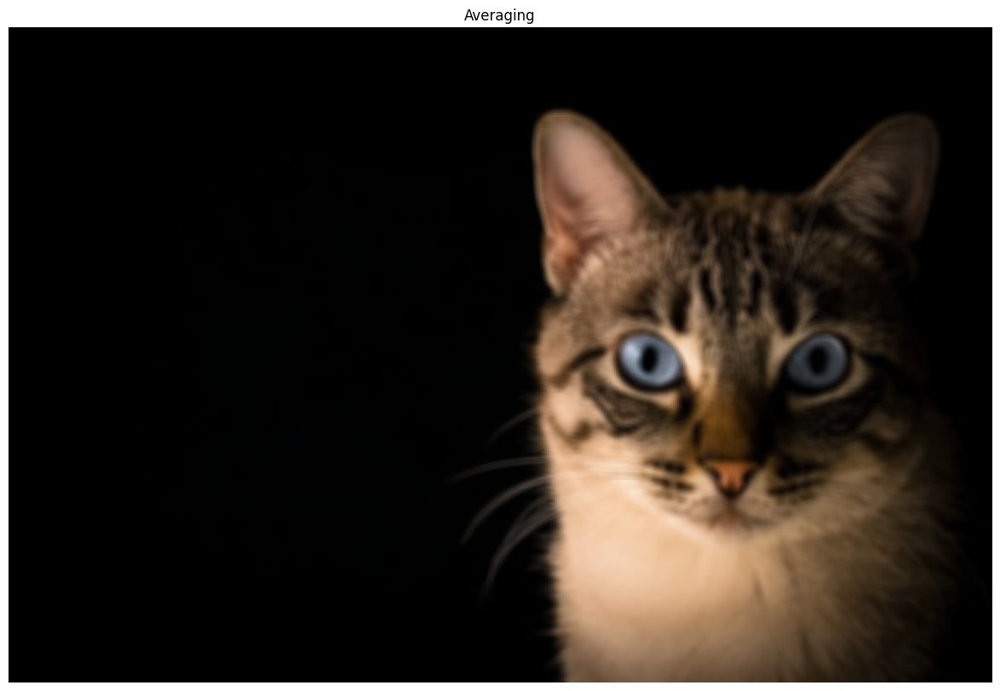

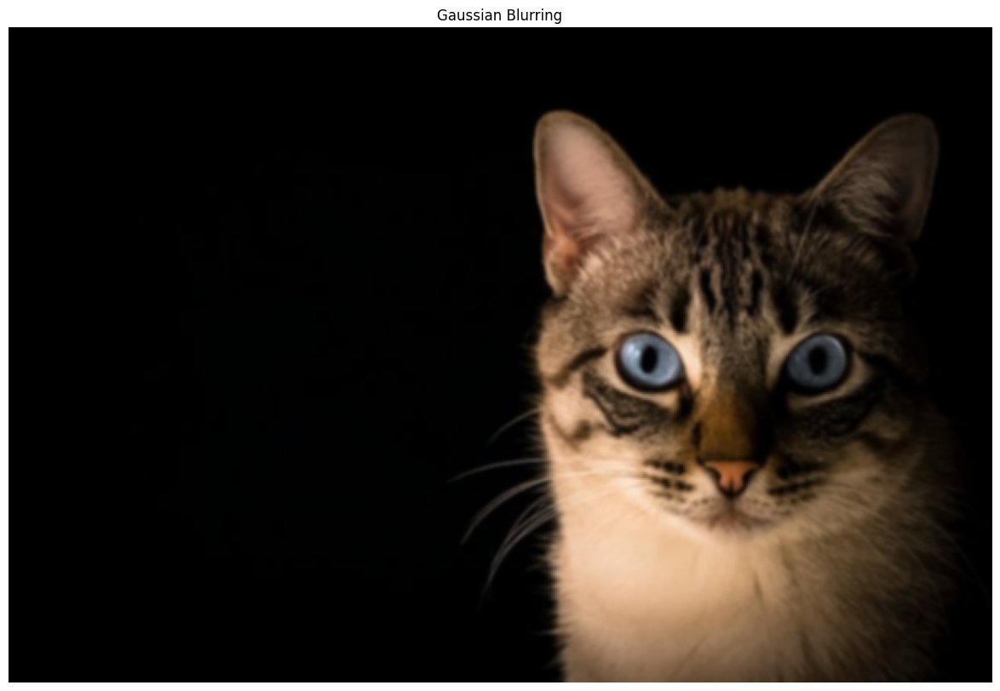

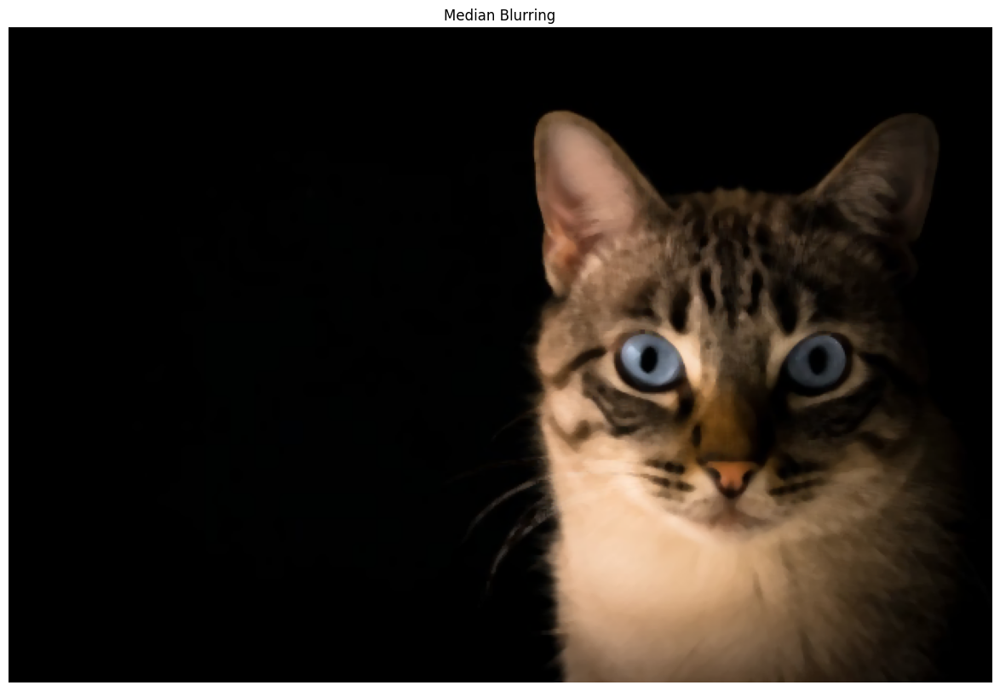

In [8]:
# Write your code here
cat = cv2.imread('cat.jpg')
avg_blur = cv2.blur(cat, (5,5))
imshow('Averaging', avg_blur)
gaussian_blur = cv2.GaussianBlur(cat, (5,5), 0)
imshow('Gaussian Blurring', gaussian_blur)
median_blur = cv2.medianBlur(cat, 5)
imshow('Median Blurring', median_blur)

## 8. Bitwise Operations
**Task:**
1. Create a $400 \times 400$ blank image.
2. Create a rectangle and a circle on separate blank images.
3. Perform Bitwise AND, OR, XOR, and NOT.

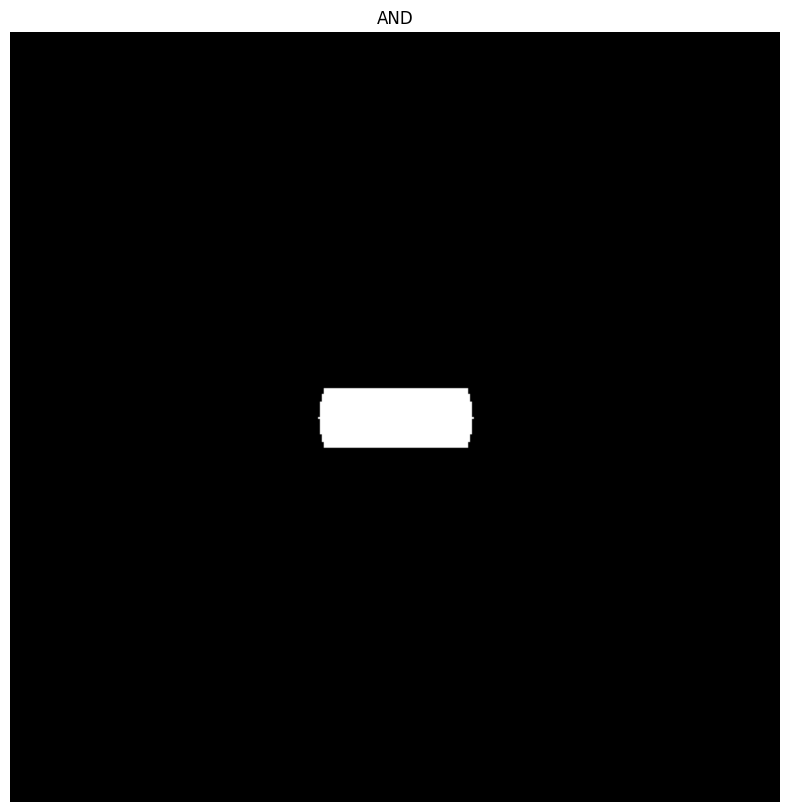

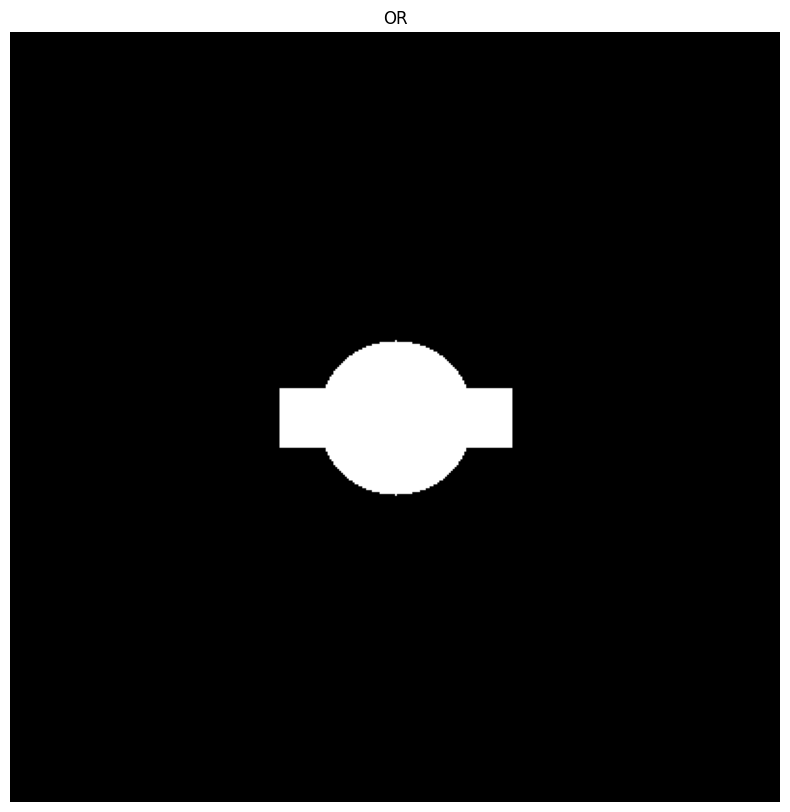

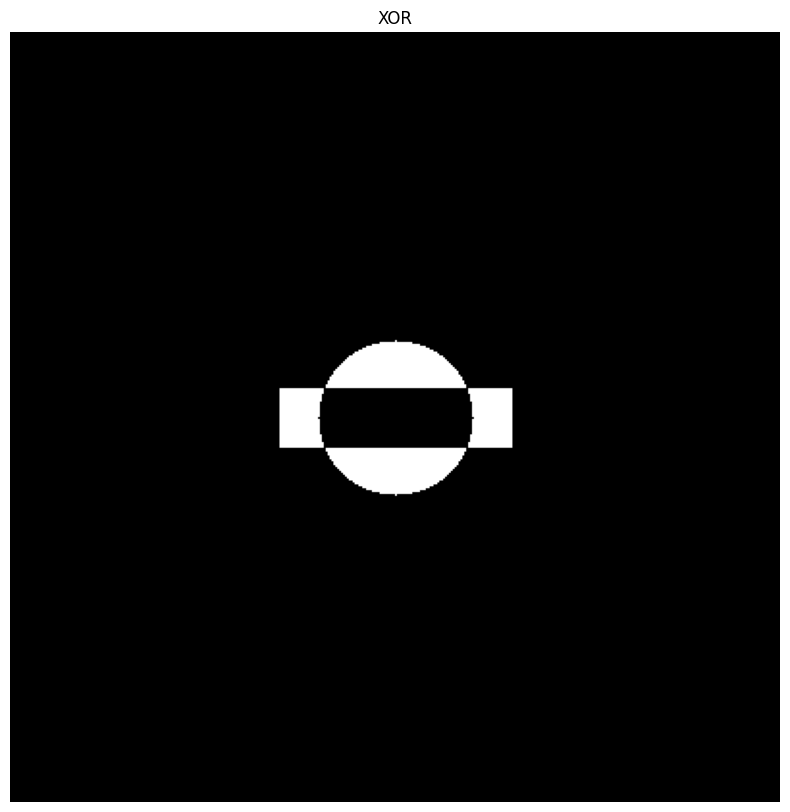

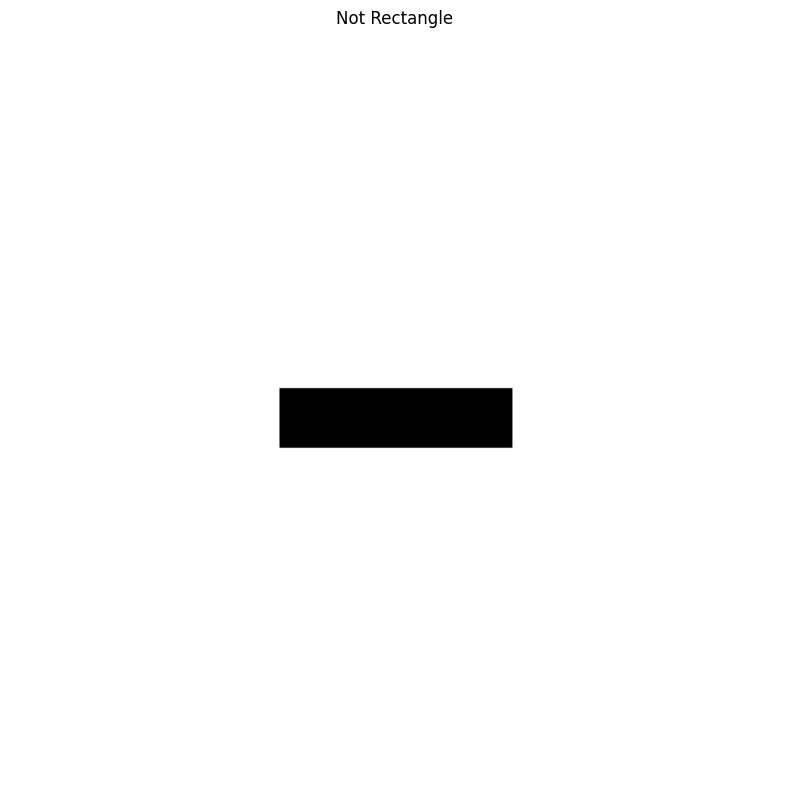

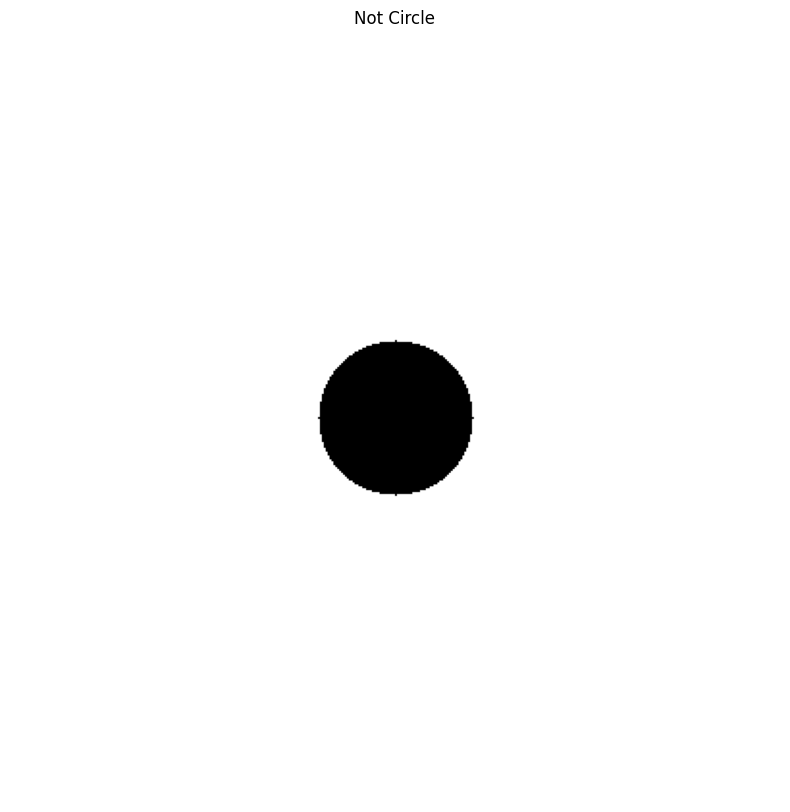

In [9]:
# Write your code here
img1 = np.zeros((400,400), np.uint8)
img2 = np.zeros((400,400), np.uint8)
cv2.rectangle(img1, (140, 185), (260, 215), 255, -1)
cv2.circle(img2, (200,200), 40, 255, -1)
# imshow('b', img1)
# imshow('2', img2)
And = cv2.bitwise_and(img1, img2)
imshow("AND", And)
Or = cv2.bitwise_or(img1, img2)
imshow('OR', Or)
Xor = cv2.bitwise_xor(img1, img2)
imshow('XOR', Xor)
Not1 = cv2.bitwise_not(img1)
imshow('Not Rectangle', Not1)
Not2 = cv2.bitwise_not(img2)
imshow('Not Circle', Not2)

## 9. Thresholding
**Task:**
1. Load `cats.jpg` and convert to grayscale.
2. Apply Simple Thresholding (Binary and Inverse).

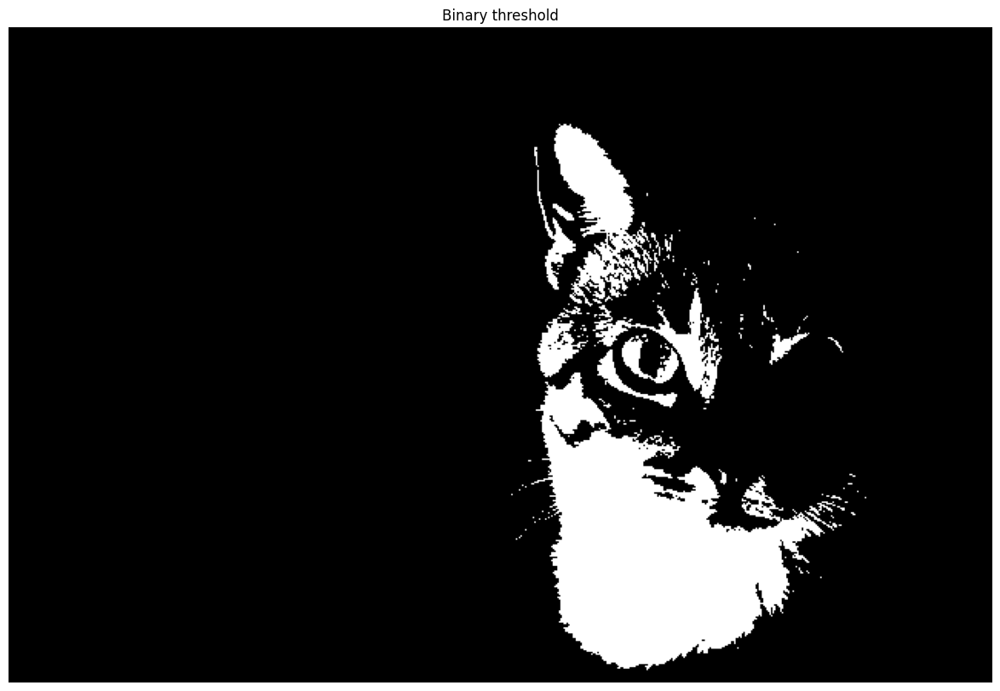

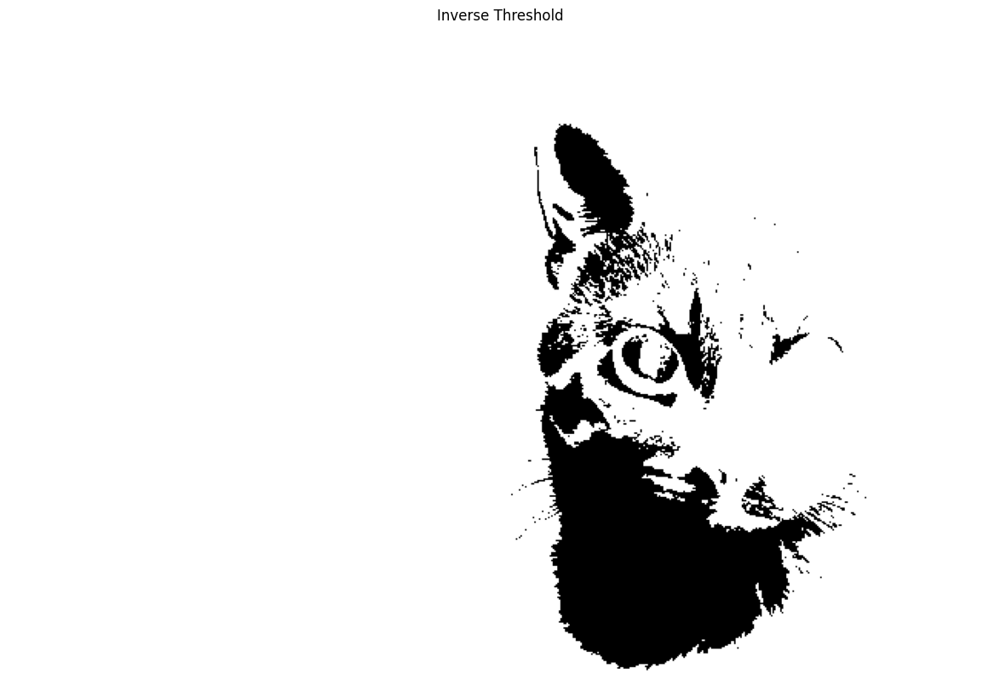

In [10]:
# Write your code here
cat = cv2.imread('cat.jpg')
gray_cat = cv2.cvtColor(cat, cv2.COLOR_BGR2GRAY)
ret,bin_th = cv2.threshold(gray_cat, 115, 255, cv2.THRESH_BINARY)
imshow('Binary threshold', bin_th)
ret,bin_inv_th = cv2.threshold(gray_cat, 115, 255, cv2.THRESH_BINARY_INV)
imshow('Inverse Threshold', bin_inv_th)